<a href="https://colab.research.google.com/github/samirp92/Final-Year-Project-Time-Series-Forecasting-/blob/main/EDA_Ele_Power_Consumption_Forecasting_Student_ID_21072112.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# *Forecasting Individual Household Electric Power Consumption*
*(Data loading, Data Preprocessing, Feature Engineering, EDA)*

# Import the required libraries

In [ ]:
# Disable warnings in the notebook for maintaining clean output
import warnings
warnings.filterwarnings('ignore')

# Import the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
# Mount the google drive
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

# Set the root path directory
root_path = "/content/drive/MyDrive/Final Year Project"

Mounted at /content/drive


# Data Loading

In [ ]:
# Load the data from google drive
df = pd.read_csv("/content/drive/MyDrive/Final Year Project/household_power_consumption.txt", sep=';')
df

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,16/12/2006,17:24:00,4.216,0.418,234.840,18.400,0.000,1.000,17.0
1,16/12/2006,17:25:00,5.360,0.436,233.630,23.000,0.000,1.000,16.0
2,16/12/2006,17:26:00,5.374,0.498,233.290,23.000,0.000,2.000,17.0
3,16/12/2006,17:27:00,5.388,0.502,233.740,23.000,0.000,1.000,17.0
4,16/12/2006,17:28:00,3.666,0.528,235.680,15.800,0.000,1.000,17.0
...,...,...,...,...,...,...,...,...,...
2075254,26/11/2010,20:58:00,0.946,0.0,240.43,4.0,0.0,0.0,0.0
2075255,26/11/2010,20:59:00,0.944,0.0,240.0,4.0,0.0,0.0,0.0
2075256,26/11/2010,21:00:00,0.938,0.0,239.82,3.8,0.0,0.0,0.0
2075257,26/11/2010,21:01:00,0.934,0.0,239.7,3.8,0.0,0.0,0.0


In [ ]:
# Display DataFrame information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075259 entries, 0 to 2075258
Data columns (total 9 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Date                   object 
 1   Time                   object 
 2   Global_active_power    object 
 3   Global_reactive_power  object 
 4   Voltage                object 
 5   Global_intensity       object 
 6   Sub_metering_1         object 
 7   Sub_metering_2         object 
 8   Sub_metering_3         float64
dtypes: float64(1), object(8)
memory usage: 142.5+ MB


Observation:-

+ All columns' data types show as "object" except Sub_metering_3 so that needs to be converted to the appropriate data type.

In [ ]:
# Setting pandas to display full decimal precision
pd.options.display.float_format = '{:.8}'.format

# Check Summary statistics
df.describe(include='all')

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
count,2075259,2075259,2075259,2075259,2075259,2075259,2075259,2075259,2049280.0
unique,1442,1440,6534,896,5168,377,153,145,NaN
top,6/12/2008,17:24:00,?,0.000,?,1.000,0.000,0.000,NaN
freq,1440,1442,25979,472786,25979,169406,1840611,1408274,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.4584474
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.4371539
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.0


Observation:-
+ The dataset has missing values represented by '?' in several columns.
+ There are a significant number of these ? entries, for example, Global_active_power has 25,979 instances of ?.

# Data Preprocessing

In [ ]:
# Replace '?' with NaN values
df.replace('?', np.nan, inplace=True)

In [ ]:
# Convert numeric columns to appropriate data types
df['Global_active_power'] = pd.to_numeric(df['Global_active_power'], errors='coerce')
df['Global_reactive_power'] = pd.to_numeric(df['Global_reactive_power'], errors='coerce')
df['Voltage'] = pd.to_numeric(df['Voltage'], errors='coerce')
df['Global_intensity'] = pd.to_numeric(df['Global_intensity'], errors='coerce')
df['Sub_metering_1'] = pd.to_numeric(df['Sub_metering_1'], errors='coerce')
df['Sub_metering_2'] = pd.to_numeric(df['Sub_metering_2'], errors='coerce')

# Confirm the updated data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075259 entries, 0 to 2075258
Data columns (total 9 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Date                   object 
 1   Time                   object 
 2   Global_active_power    float64
 3   Global_reactive_power  float64
 4   Voltage                float64
 5   Global_intensity       float64
 6   Sub_metering_1         float64
 7   Sub_metering_2         float64
 8   Sub_metering_3         float64
dtypes: float64(7), object(2)
memory usage: 142.5+ MB


In [ ]:
# Convert the 'Date' and 'Time' columns to a single 'date_time' column
df['date_time'] = pd.to_datetime(df['Date'] + ' ' + df['Time'])

# Convert the 'date_time' column to datetime format
df['date_time'] = pd.to_datetime(df['date_time'])

# Set the 'date_time' column as the index
df.set_index('date_time', inplace=True)

# Drop the original 'Date' and 'Time' columns
df.drop(columns=['Date', 'Time'], inplace=True)

# Copy the original DataFrame into a new DataFrame
df_copy = df.copy()
df_copy

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
date_time,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0
2006-12-16 17:25:00,5.36,0.436,233.63,23.0,0.0,1.0,16.0
2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0
2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0
2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0
...,...,...,...,...,...,...,...
2010-11-26 20:58:00,0.946,0.0,240.43,4.0,0.0,0.0,0.0
2010-11-26 20:59:00,0.944,0.0,240.0,4.0,0.0,0.0,0.0
2010-11-26 21:00:00,0.938,0.0,239.82,3.8,0.0,0.0,0.0


# Data Imputation

In [ ]:
# Check Missing Values
df.isnull().sum()

Global_active_power      25979
Global_reactive_power    25979
Voltage                  25979
Global_intensity         25979
Sub_metering_1           25979
Sub_metering_2           25979
Sub_metering_3           25979
dtype: int64

Observation:-
+ There are total 25979 rows which are Null (nearly 1.25% of the total rows)
+ For this problem, I will use either forward or backward fill because The records are taken every minute.

In [ ]:
# Apply MICE imputer
imputer = IterativeImputer(random_state=0)
df_imputed = imputer.fit_transform(df)

# Convert back to DataFrame
df_imputed = pd.DataFrame(df_imputed, index=df.index, columns=df.columns)

# Fill NaN values using the mean for each column
#df_imputed = df.copy()
#df_imputed.fillna(df.mean(), inplace=True)

In [ ]:
# Check Missing Values after imputation
df_imputed.isnull().sum()

Global_active_power      0
Global_reactive_power    0
Voltage                  0
Global_intensity         0
Sub_metering_1           0
Sub_metering_2           0
Sub_metering_3           0
dtype: int64

Note:-
+ (Global_active_power*1000/60 - Sub_metering_1 - Sub_metering_2 - Sub_metering_3) represents the active energy consumed every minute (in watt hour) in the household by electrical equipment not measured in sub-meterings 1, 2 and 3

In [ ]:
# Creating new variable for remaining power consumption in watt hour
equation1 = (df_imputed['Global_active_power']*1000/60)
equation2 = df_imputed['Sub_metering_1'] + df_imputed['Sub_metering_2'] + df_imputed['Sub_metering_3']
df_imputed['Sub_metering_4'] = equation1 - equation2
df_imputed

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Sub_metering_4
date_time,,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0,52.266667
2006-12-16 17:25:00,5.36,0.436,233.63,23.0,0.0,1.0,16.0,72.333333
2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0,70.566667
2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0,71.8
2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0,43.1
...,...,...,...,...,...,...,...,...
2010-11-26 20:58:00,0.946,0.0,240.43,4.0,0.0,0.0,0.0,15.766667
2010-11-26 20:59:00,0.944,0.0,240.0,4.0,0.0,0.0,0.0,15.733333
2010-11-26 21:00:00,0.938,0.0,239.82,3.8,0.0,0.0,0.0,15.633333


In [ ]:
# Check Summary statistics after Data Preprocessing
df_imputed.describe(include='all')

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Sub_metering_4
count,2075259.0,2075259.0,2075259.0,2075259.0,2075259.0,2075259.0,2075259.0,2075259.0
mean,1.091615,0.12371448,240.83986,4.6277593,1.1219233,1.29852,6.4584474,9.3146933
std,1.0506555,0.11201421,3.219643,4.4164902,6.1143966,5.7854704,8.3841776,9.5257263
min,0.076,0.0,223.2,0.2,0.0,0.0,0.0,-2.4
25%,0.31,0.048,239.02,1.4,0.0,0.0,0.0,3.8333333
50%,0.63,0.102,240.96,2.8,0.0,0.0,1.0,5.5666667
75%,1.52,0.192,242.86,6.4,0.0,1.0,17.0,10.233333
max,11.122,1.39,254.15,48.4,88.0,80.0,31.0,124.83333


# Data Visualization

<Figure size 1920x1440 with 0 Axes>

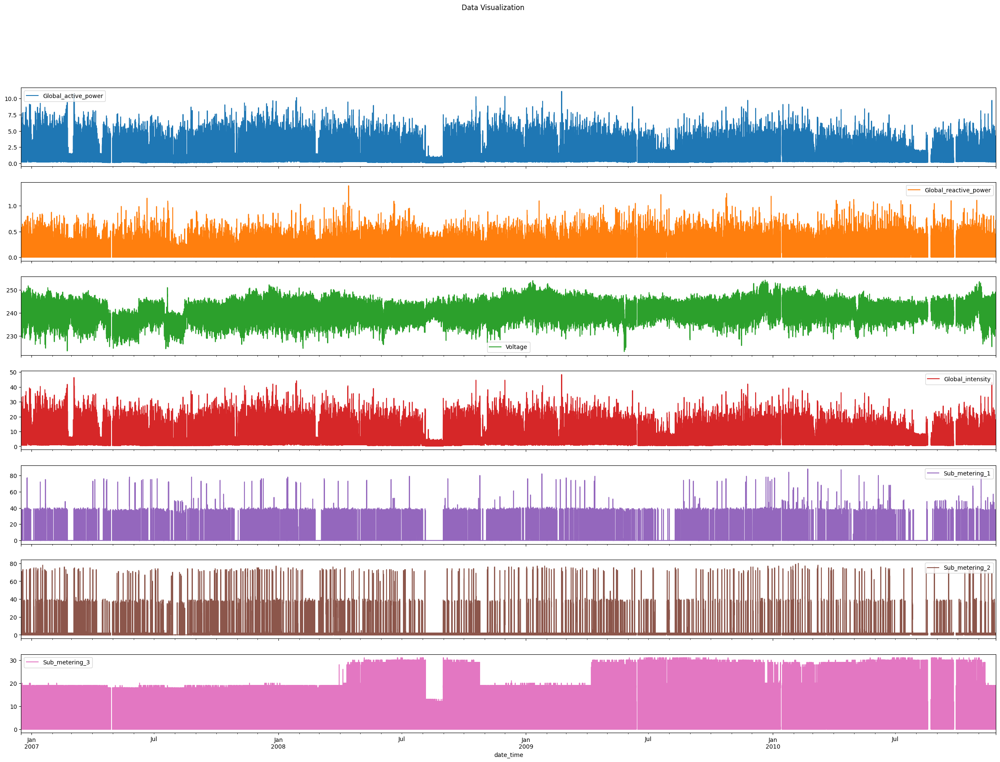

In [ ]:
# Visualize the data
plt.figure(dpi=300)
df.plot(subplots=True, figsize=(30,20), title="Data Visualization")
plt.show()

## Visualize the data year wise

<Figure size 1920x1440 with 0 Axes>

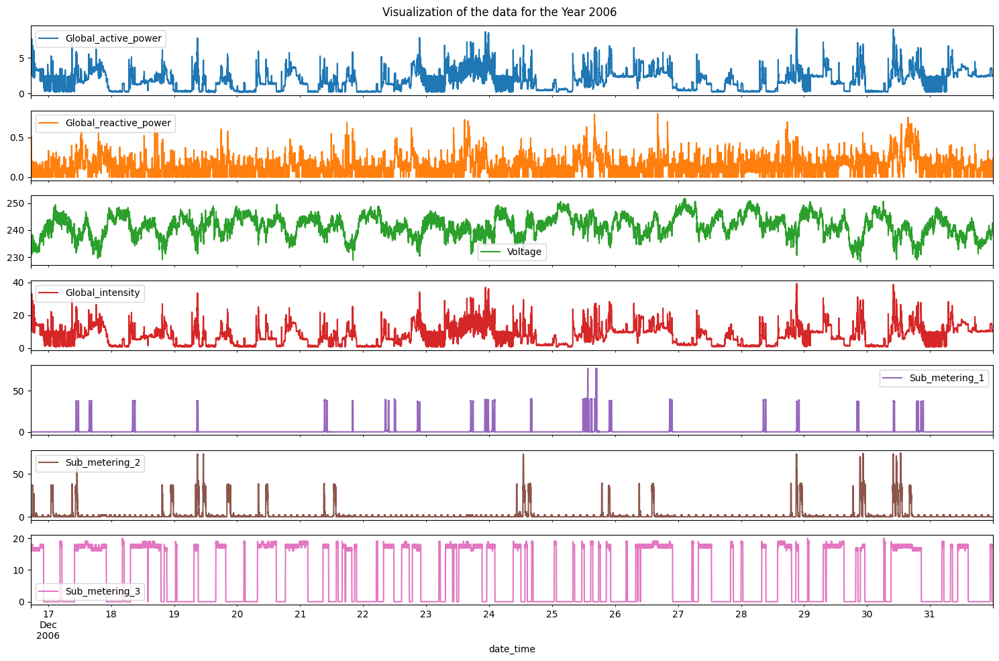

<Figure size 1920x1440 with 0 Axes>

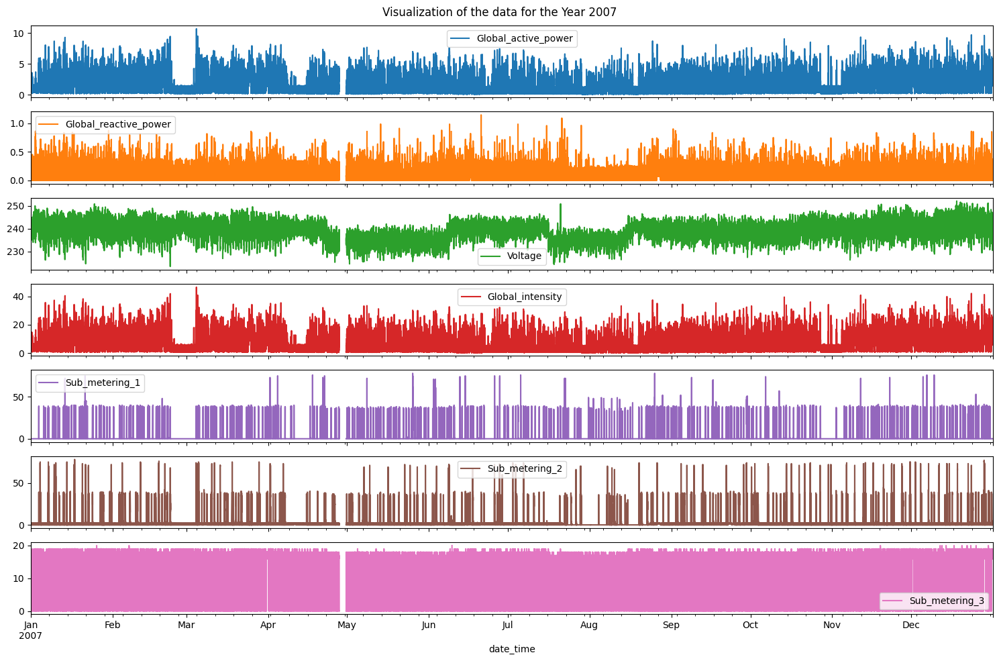

<Figure size 1920x1440 with 0 Axes>

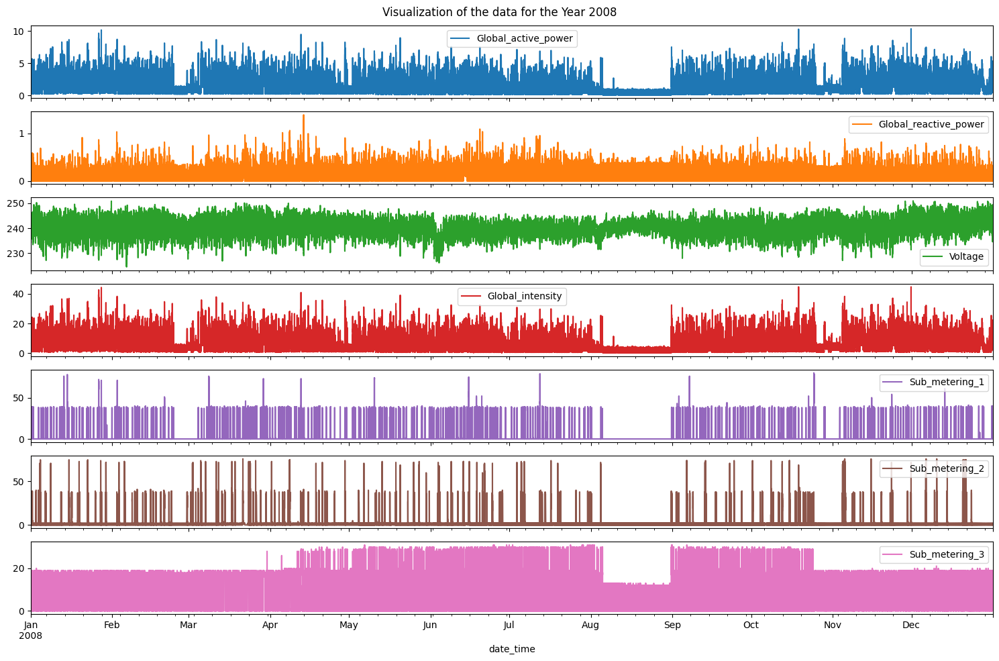

<Figure size 1920x1440 with 0 Axes>

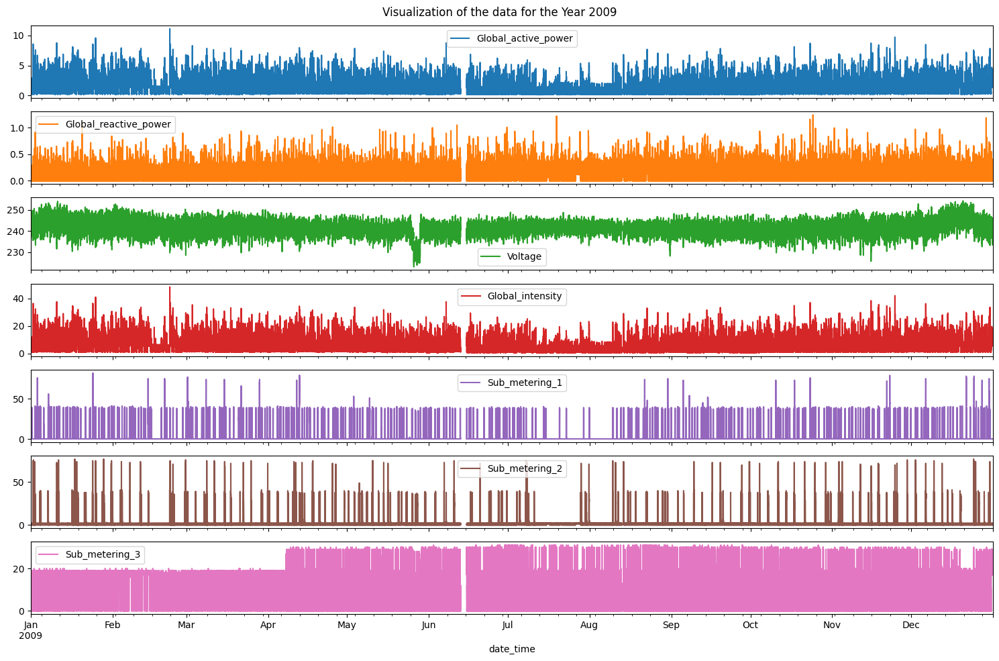

<Figure size 1920x1440 with 0 Axes>

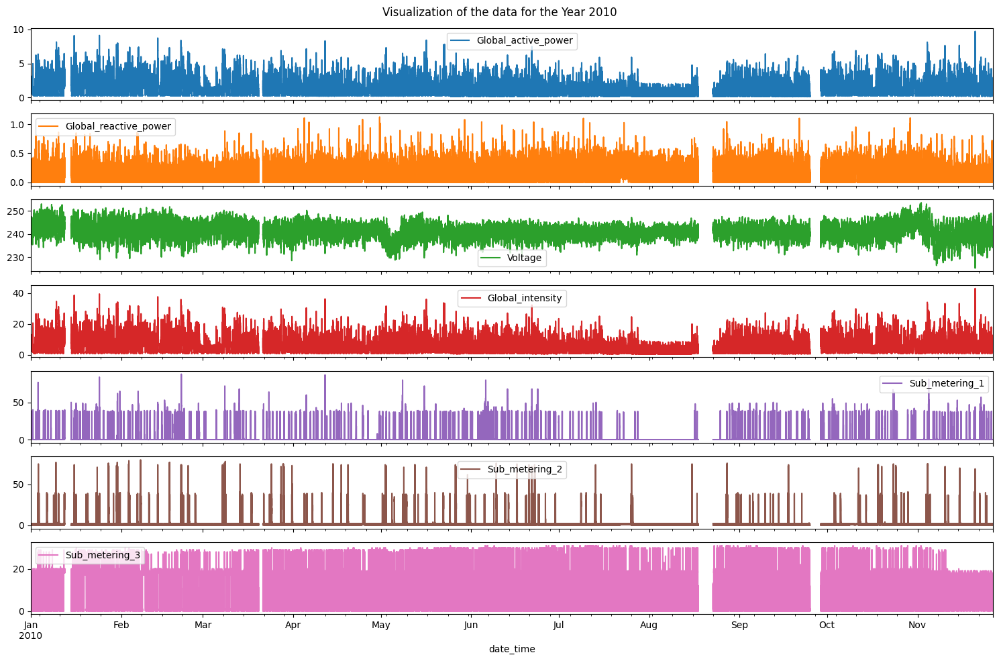

In [ ]:
# Get the list of unique years
unique_years = df.index.year.unique()

# Plotting data for each year
for year in unique_years:
    df_year = df[df.index.year == year]
    plt.figure(dpi=300)
    df_year.plot(subplots=True, figsize=(15, 10), title=f"Visualization of the data for the Year {year}")
    plt.tight_layout()
    plt.show()

Observation:-

Global Active Power:
+ It is observed that there is an yearly seasonal pattern in this feature with some spikes.

Global Reactive Power:
+ It is observed that there is a yearly seasonal pattern in this feature (with some spikes) but showing less variation as compared Global_active_power.

Voltage:
+ It is observed that there is a strong repeating seasonal pattern in this feature across every year.
At the beginning of every year it fluctuates a lot between 250 and 260 volts, but in between (near July) in every year it kinds of reduces and then spikes again as the year ends.

Global Intensity:
+ It is observed that the values do spike towards the beginning of each year but then go somewhat constant and then increase again during the end of each year.

Sub_metering_1:
+ This feature represents the kitchen area of the house. It is observed that values for this feature are strongly constant throughout every year with some spikes representing heavy usage of the kitchen during those time stamps.

Sub_metering_2:
+ This feature represents the laundry area of the house. It is observed that values for this feature are in periodic intervals throughout every year with some spikes representing heavy usage of laundry area during those time stamps.

Sub_metering_3:
+ This feature represents the electric water heater and the air conditioner in the house.
+ For the year 2007: It is observed that the values almost remain constant throughout the year. electric water heater and air conditioner are equivalently used in their respective seasons.
For the year 2008: It is observed that the temperature increased as compared to previous. Hence, both devices were used extensively in their respective seasons.
+ For the Year 2009 and 2010: It is observed that from the month of May-2009 to November-2010 temperature became pretty ferocious (during both summer and winter) and both the appliances were used extensively.

## Distribution of data before preprocessing

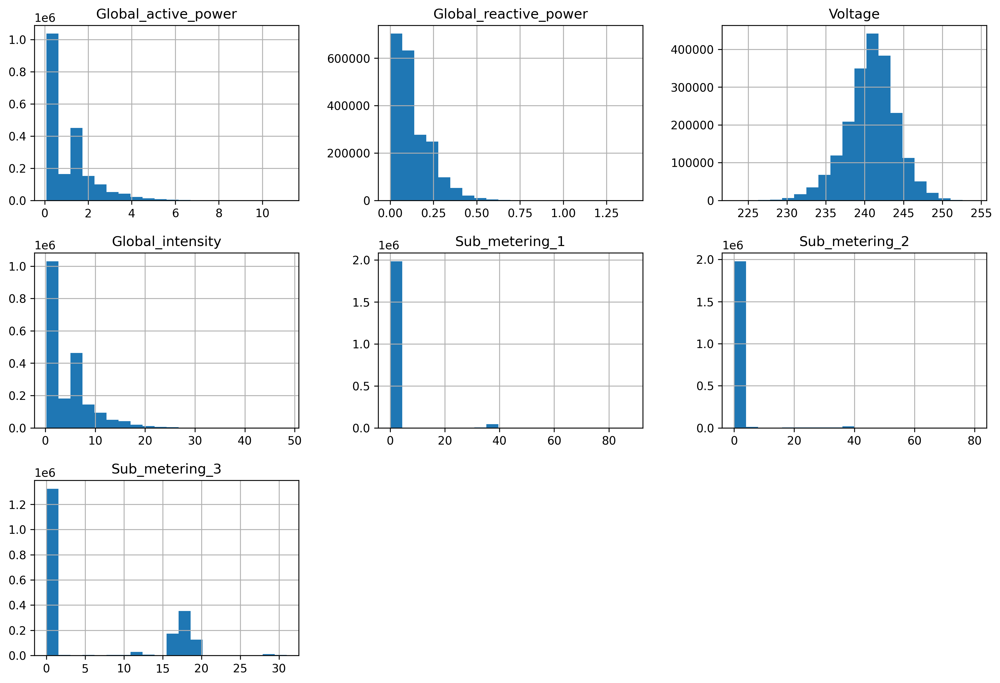

In [ ]:
# See the distribution of data before preprocessing
df.hist(figsize=(15, 10), bins=20)
plt.gcf().set_dpi(300)

Observation:-
+ Voltage has close to normal distribution.
+ Global_active_power, Global_intensity, Sub_metering_1, Sub_metering_2, Sub_metering_3 and Global_reactive_power have skewed distribution towards low values.

## Distribution of data after preprocessing

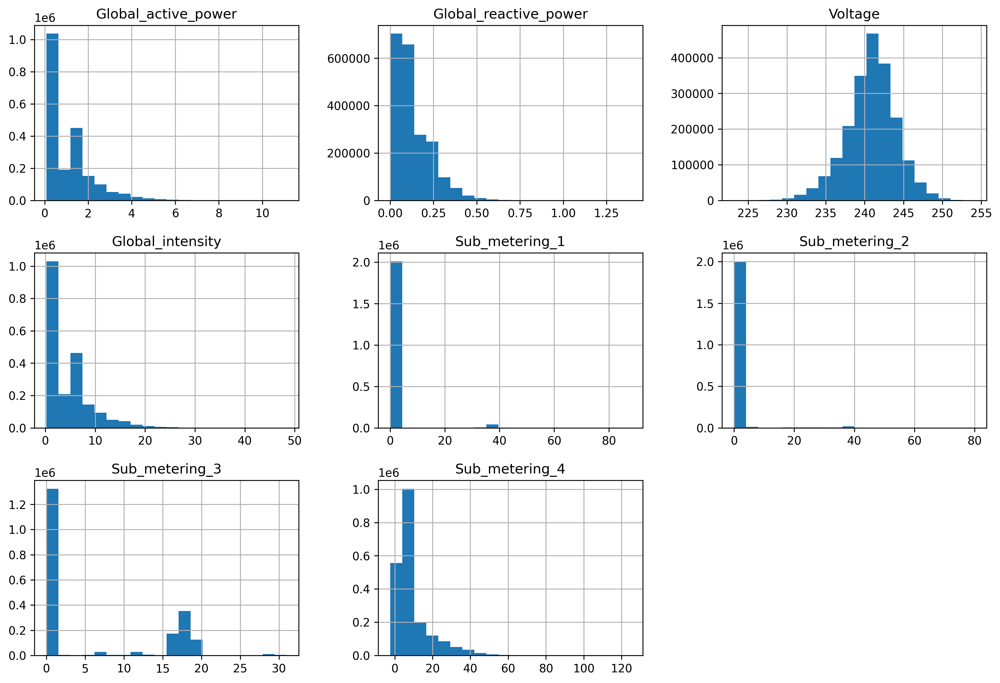

In [ ]:
# See the distribution of data after data after preprocessing
df_imputed.hist(figsize=(15, 10), bins=20)
plt.gcf().set_dpi(300)

Observation:-
+ As filling NAN values the distribution of data is not affected which sounds good.

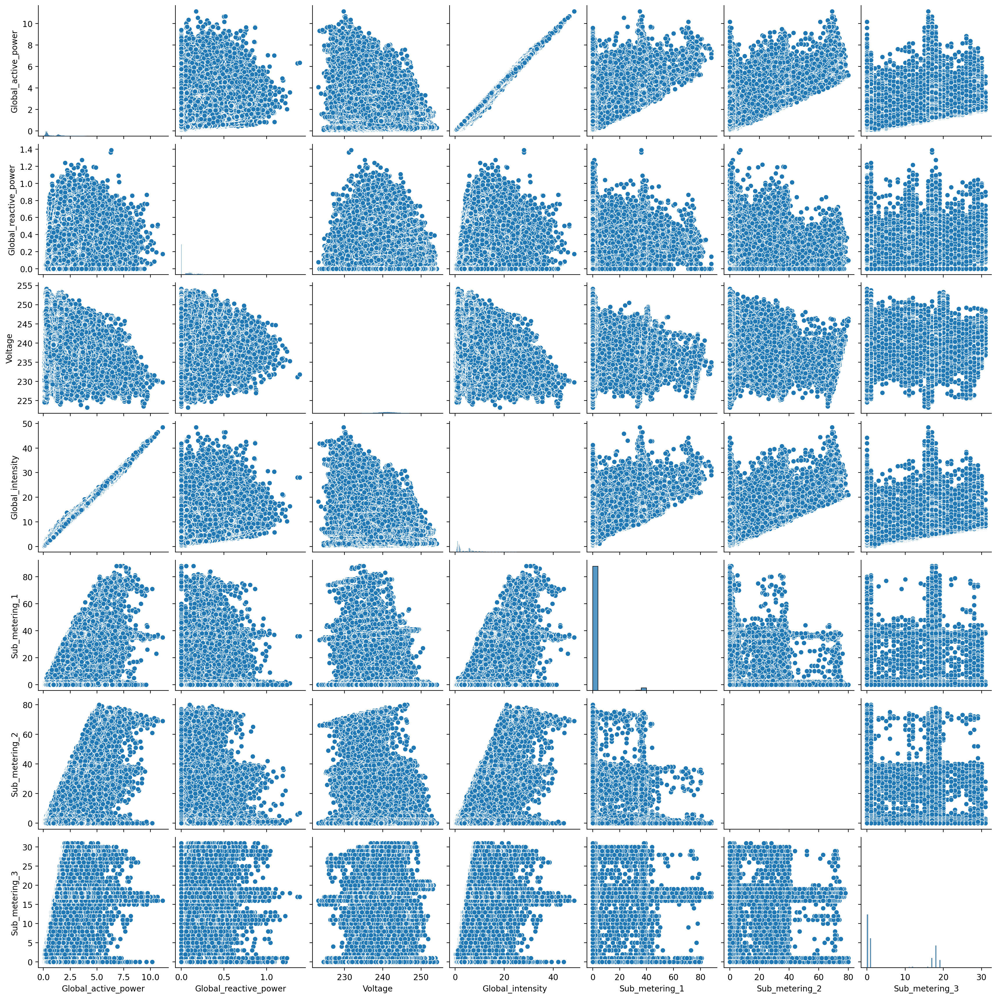

In [ ]:
# Plot the pair plot
sns.pairplot(df)
plt.gcf().set_dpi(200)
plt.show()

## Correlation Matrix

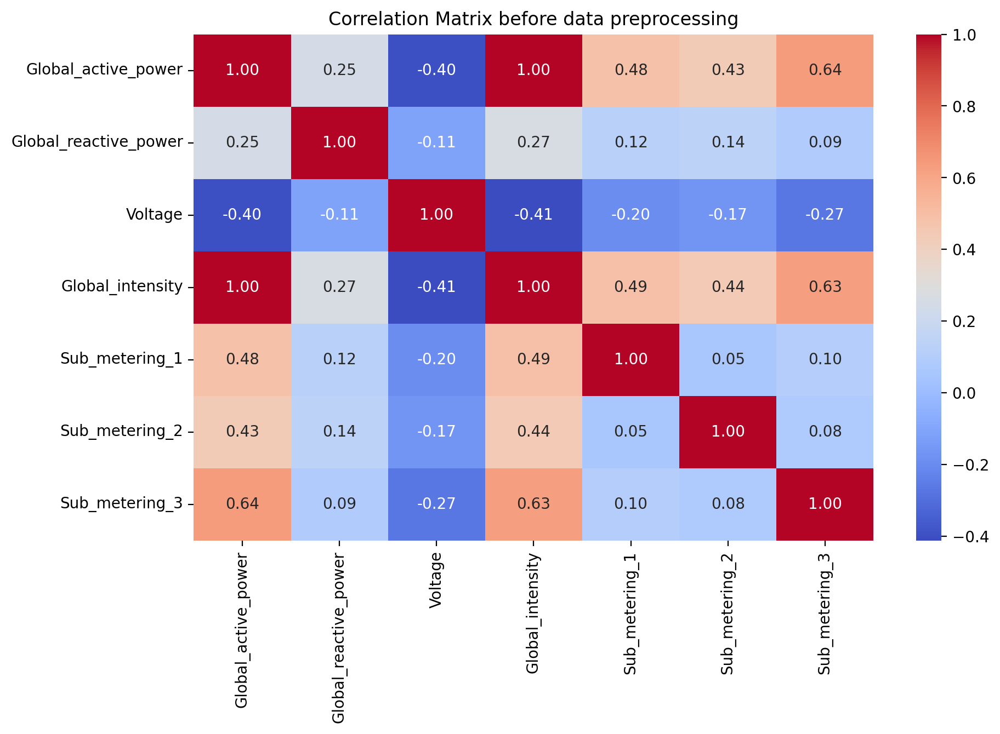

In [ ]:
# Plot the heatmap for Correlation before data preprocessing
plt.figure(figsize=(10,6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix before data preprocessing')
plt.gcf().set_dpi(200)

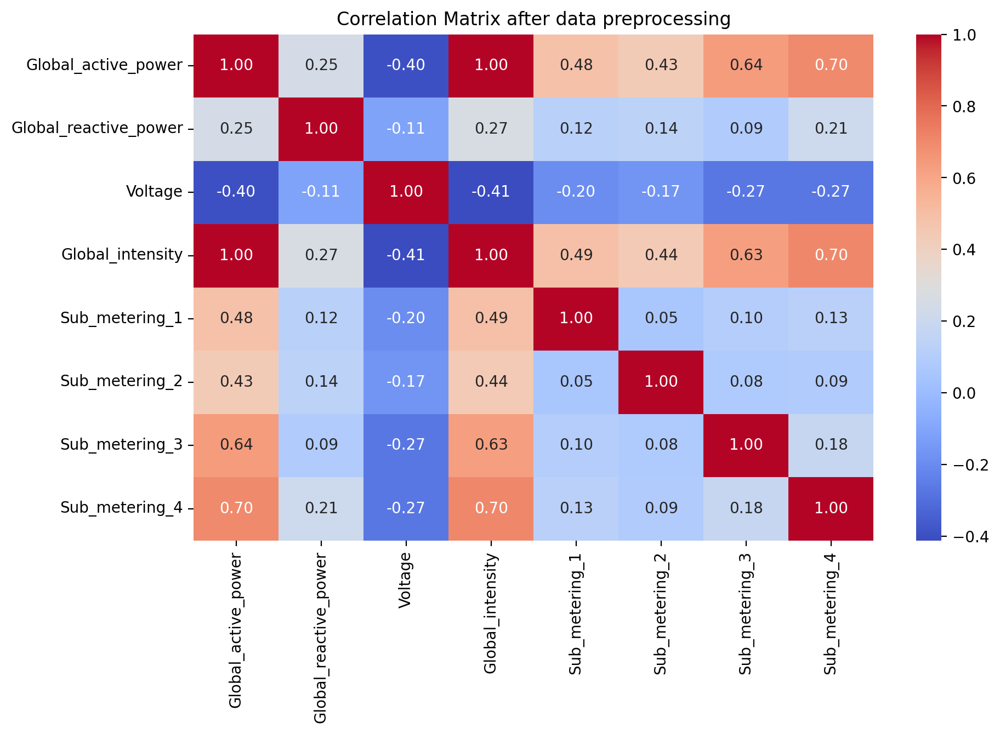

In [ ]:
# Plot the heatmap for Correlation after data preprocessing
plt.figure(figsize=(10,6))
sns.heatmap(df_imputed.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix after data preprocessing')
plt.gcf().set_dpi(200)

Observation:-
+ As Global_intensity and and sub_metering_4 are highly correlated with Global_active_power so these columns must be removed during the train/test split.

In [ ]:
# Make new dataFrame
df1 = df_imputed[["Global_active_power", "Global_reactive_power", "Voltage", "Global_intensity",
          "Sub_metering_1", "Sub_metering_2", "Sub_metering_3", "Sub_metering_4"]]

## Resample the data

In [ ]:
# Resample the data for more meaningful time series analysis
hourly_resampled = df1.resample('H').mean()
daily_resampled = df1.resample('D').mean()
weekly_resampled = df1.resample('W').mean()
monthly_resampled = df1.resample('M').mean()
yearly_resampled = df1.resample('Y').mean()

In [ ]:
# Define a function to plot the visualization, distribution and correlation of resampled data
def df_visu_dist_corr(df, resample_type, title):

  # Resample the data
  df_resampled = df.resample(resample_type).mean()

  print('Shape after %s resampling of data : %s ' %(title, df_resampled.shape))
  print('\n')

  # Plot Resampled Data set
  df_resampled.plot(subplots=True, figsize=(25,20))
  plt.suptitle("Visualization of %s Resampled Data" %title, fontsize=30, color='blue')
  plt.tight_layout(rect=[0, 0, 1, 0.96])
  plt.show()

  # Plot distribution
  print(' \n\n************************************************ Distribution Plot for %s Resampled Data **************************************************' %title, end="\n\n")
  df_resampled.hist(figsize=(15, 10), bins=50)
  plt.tight_layout(rect=[0, 0, 1, 0.96])
  plt.gcf().set_dpi(300)
  plt.show()

  # Plot correlation plot
  print(' \n\n************************************************ Correlation Plot for %s Resampled Data **************************************************' %title, end="\n\n")
  plt.figure(figsize=(10,6))
  sns.heatmap(df_resampled.corr(), annot=True, cmap='coolwarm', fmt='.2f')
  plt.tight_layout(rect=[0, 0, 1, 0.96])
  plt.gcf().set_dpi(200)
  plt.show()

## Visualization, distribution and correlation of resampled data

Shape after Hourly resampling of data : (34222, 8) 




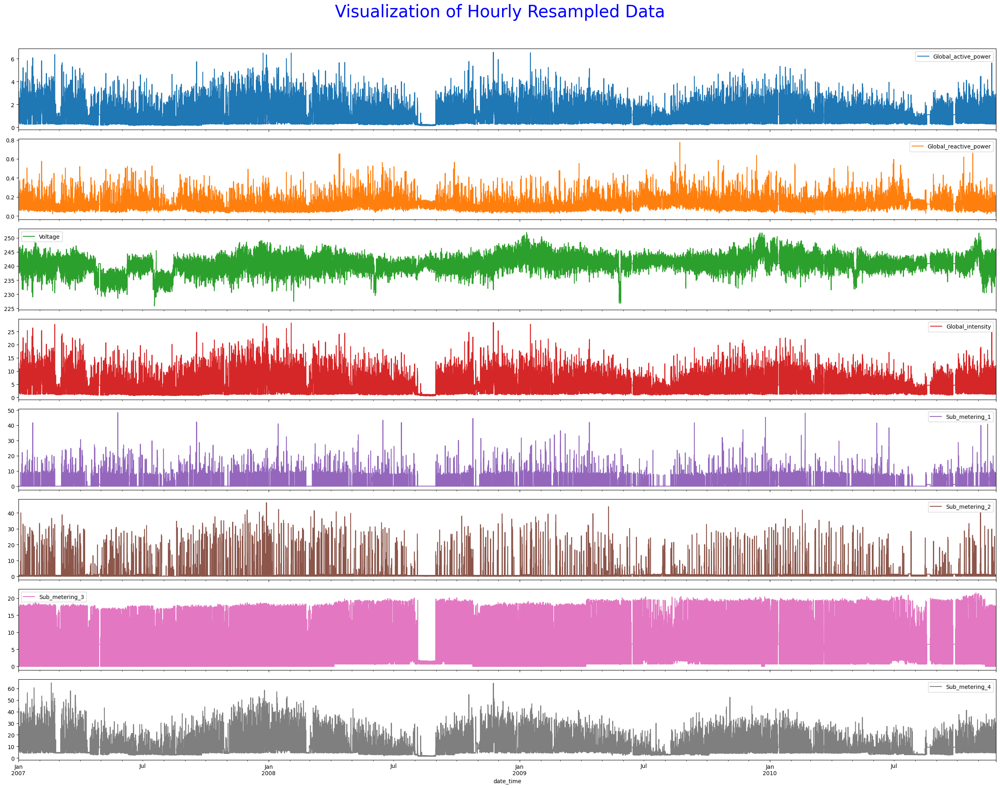

 

************************************************ Distribution Plot for Hourly Resampled Data **************************************************



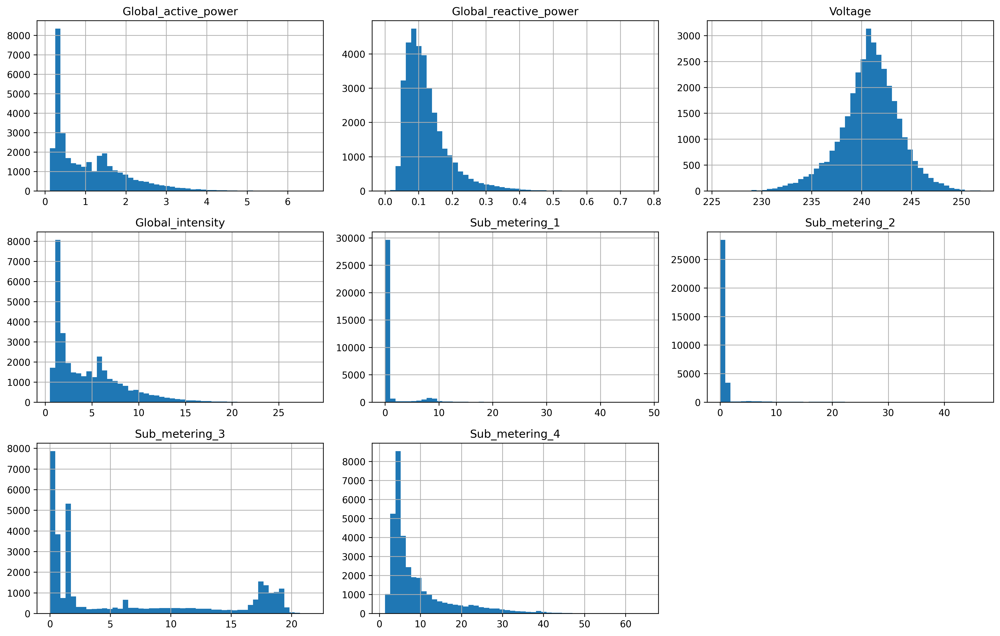

 

************************************************ Correlation Plot for Hourly Resampled Data **************************************************



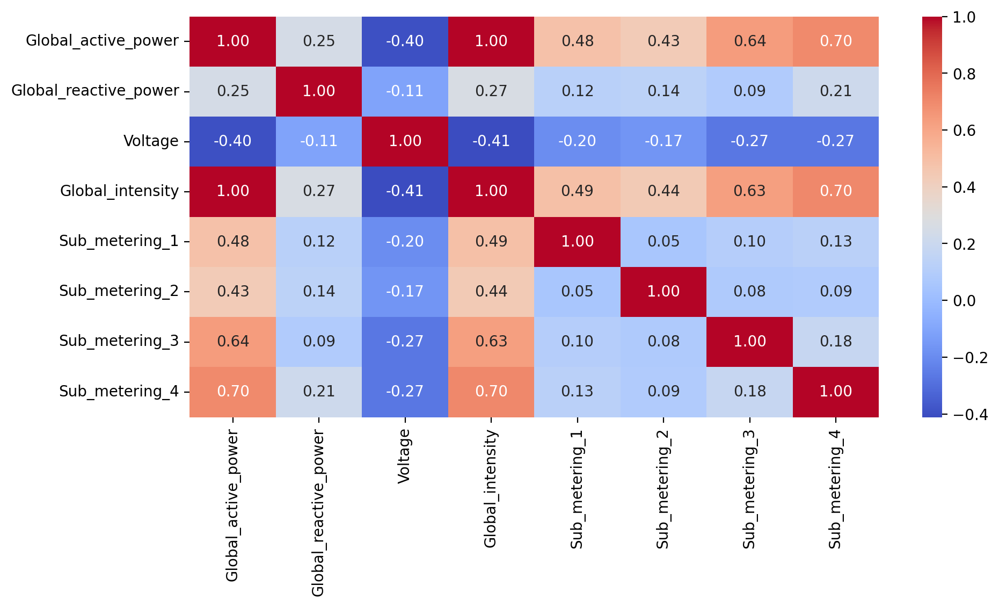

In [ ]:
# Plot the visualization, distribution and correlation of Hourly resampled data
df_visu_dist_corr(df1, "H", "Hourly")

Shape after Daily resampling of data : (1426, 8) 




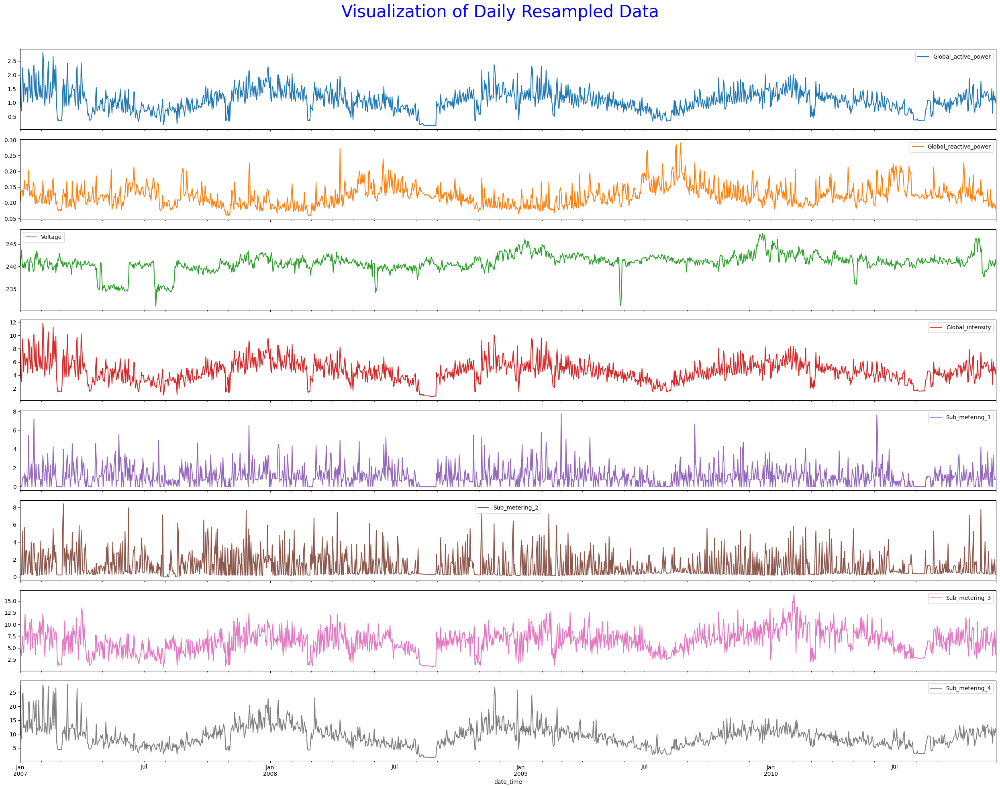

 

************************************************ Distribution Plot for Daily Resampled Data **************************************************



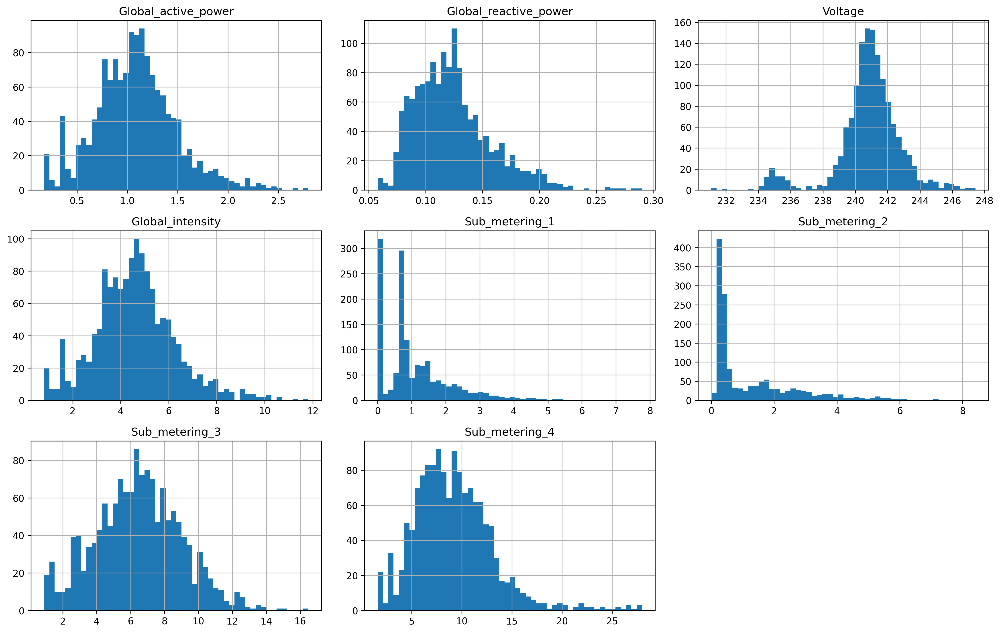

 

************************************************ Correlation Plot for Daily Resampled Data **************************************************



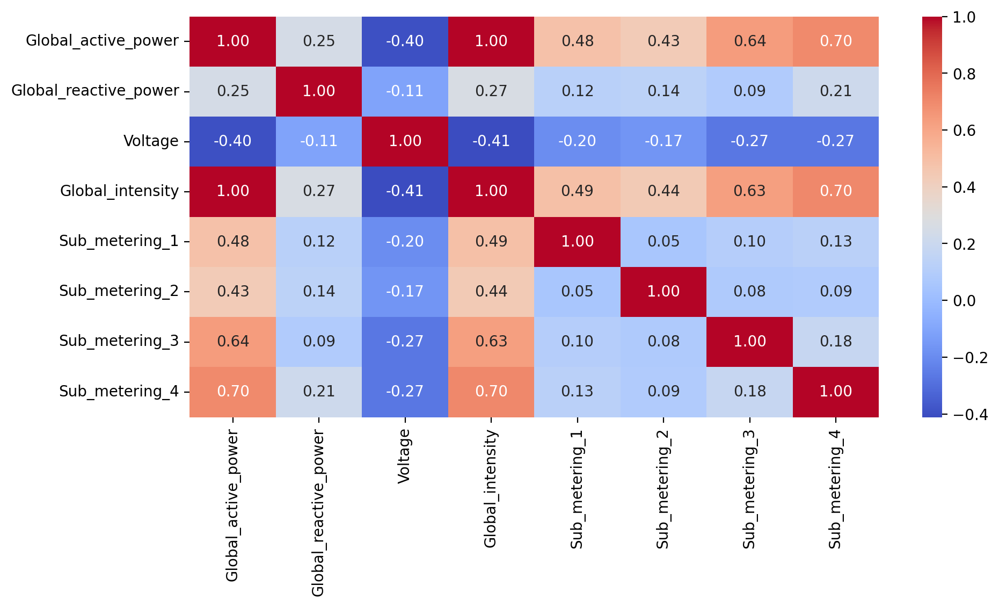

In [ ]:
# Plot the visualization, distribution and correlation of Daily resampled data
df_visu_dist_corr(df1, "D", "Daily")

Shape after Weekly resampling of data : (204, 8) 




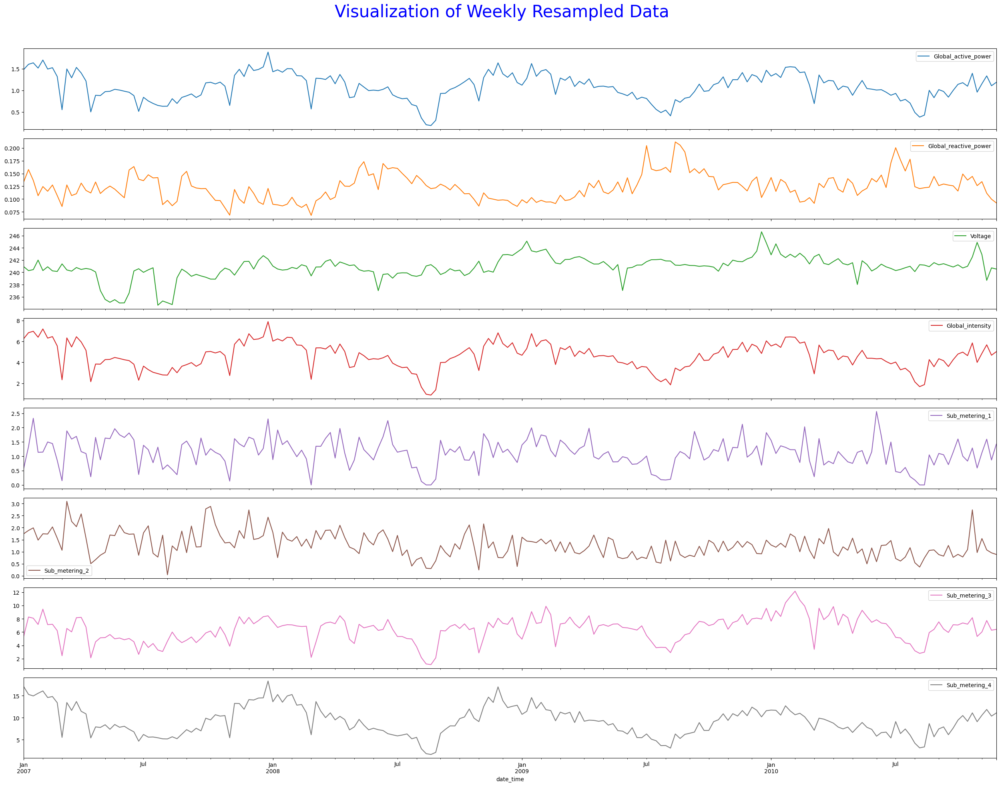

 

************************************************ Distribution Plot for Weekly Resampled Data **************************************************



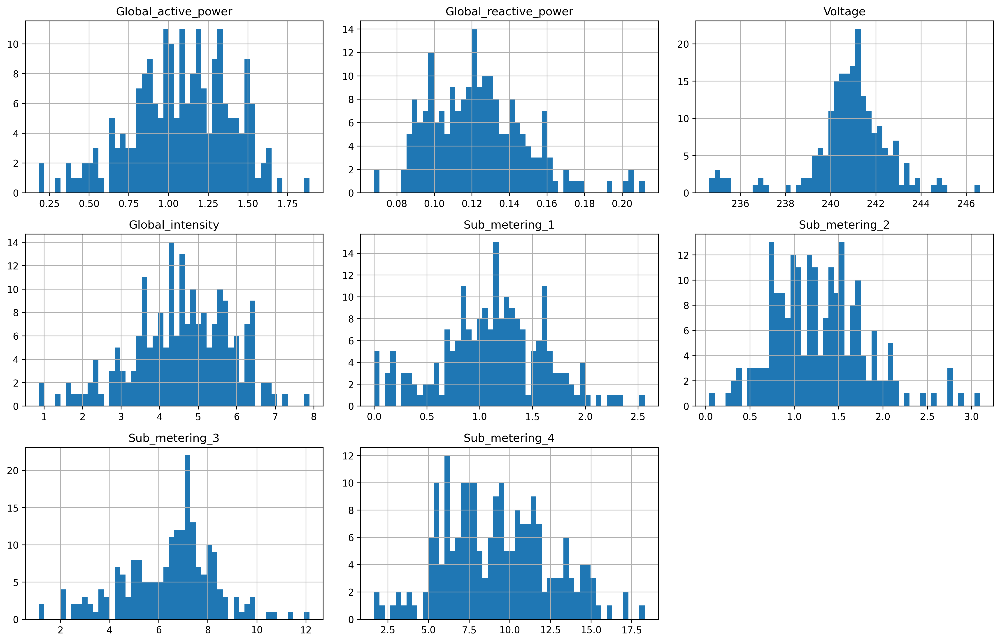

 

************************************************ Correlation Plot for Weekly Resampled Data **************************************************



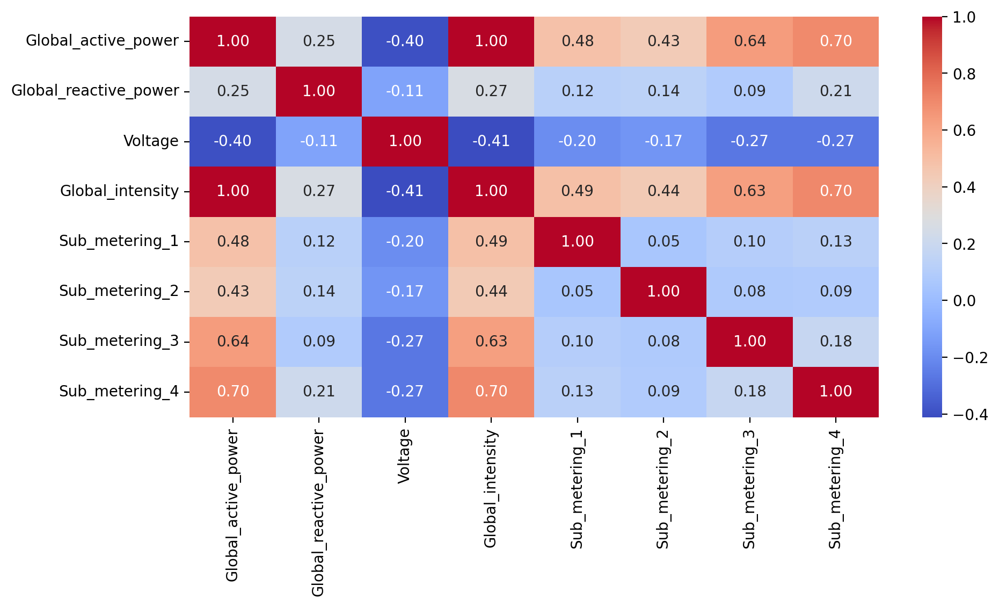

In [ ]:
# Plot the visualization, distribution and correlation of Weekly resampled data
df_visu_dist_corr(df1, "W", "Weekly")

Shape after Monthly resampling of data : (47, 8) 




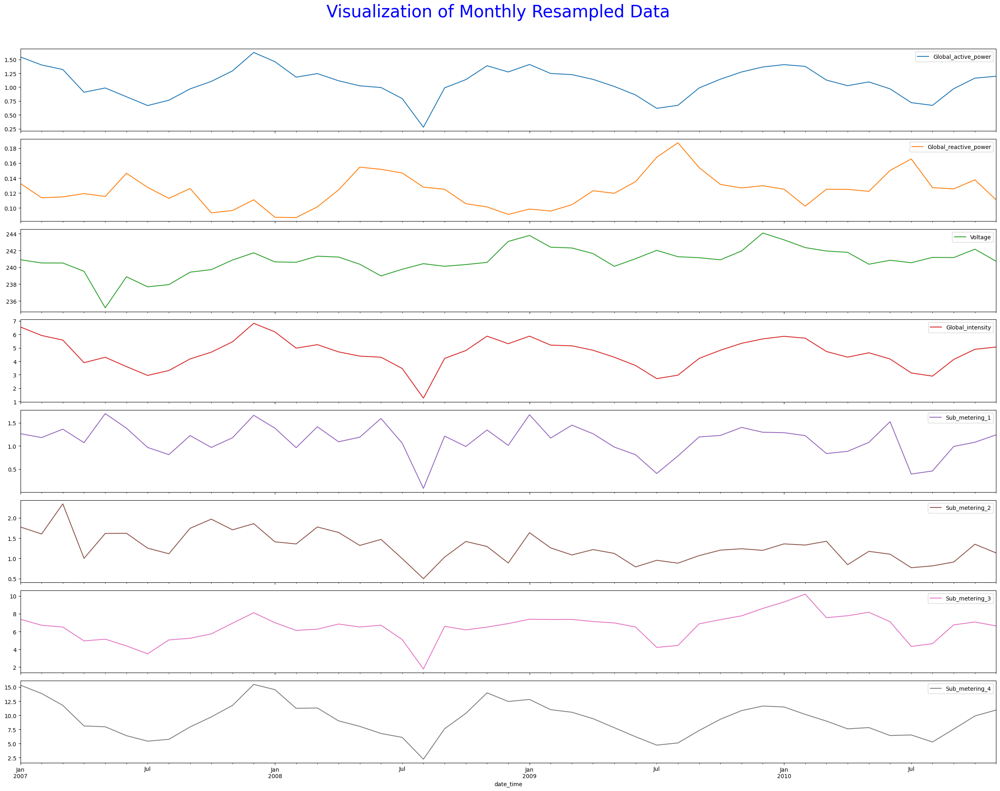

 

************************************************ Distribution Plot for Monthly Resampled Data **************************************************



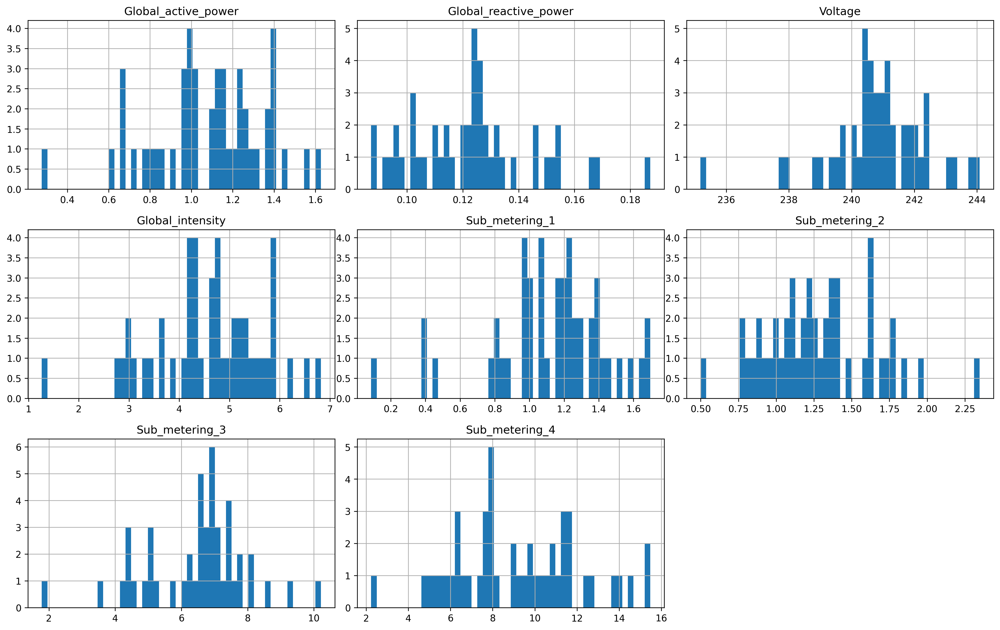

 

************************************************ Correlation Plot for Monthly Resampled Data **************************************************



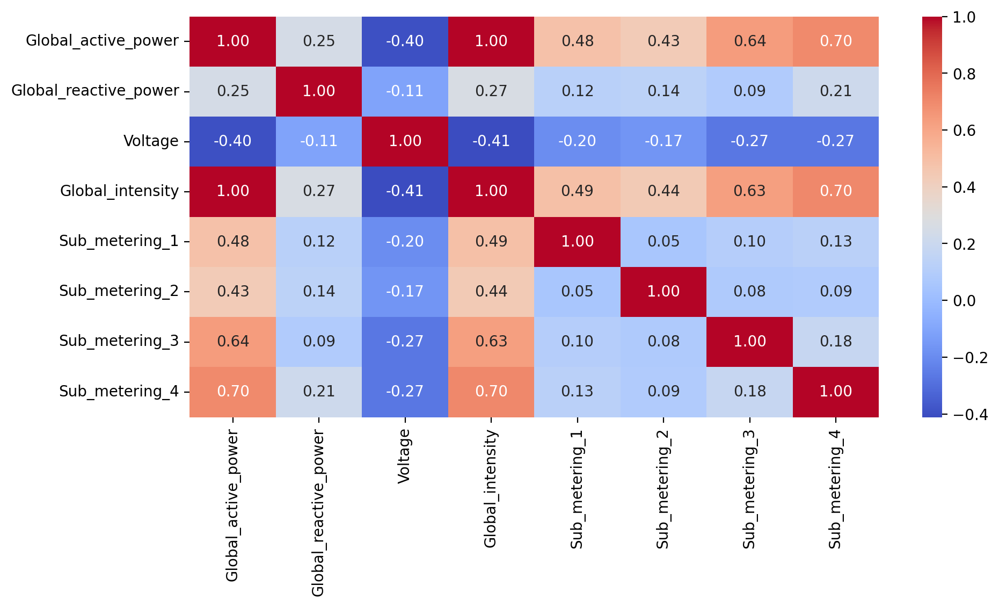

In [ ]:
# Plot the visualization, distribution and correlation of Monthly resampled data
df_visu_dist_corr(df1, "M", "Monthly")

Shape after Yearly resampling of data : (4, 8) 




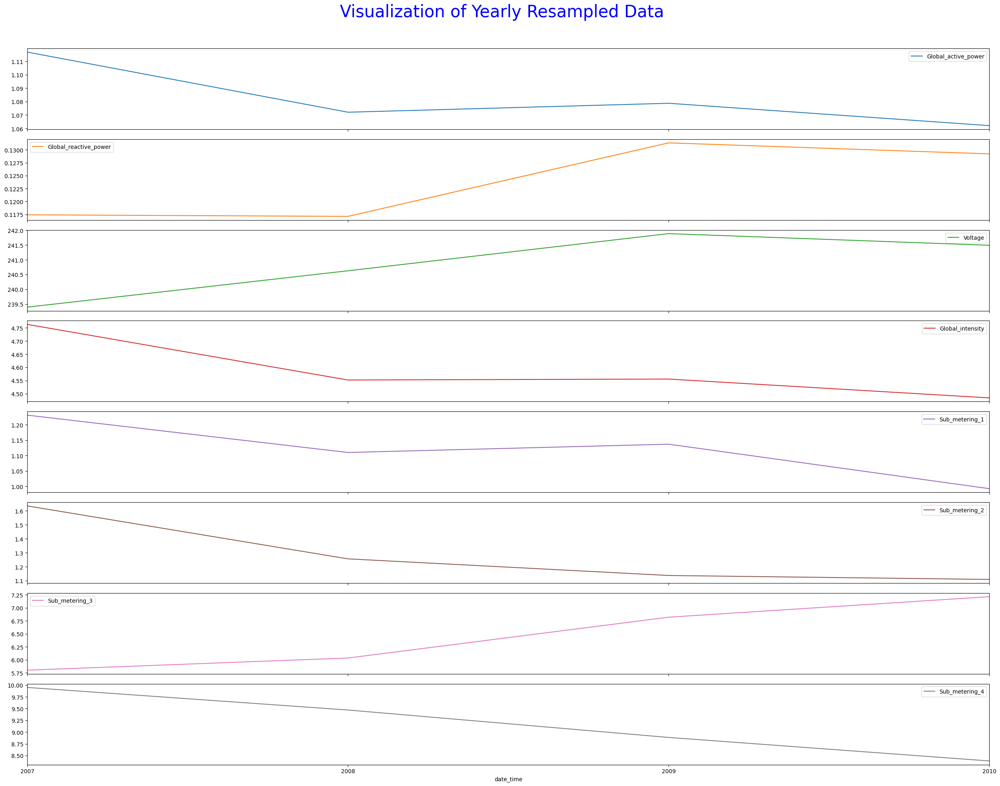

 

************************************************ Distribution Plot for Yearly Resampled Data **************************************************



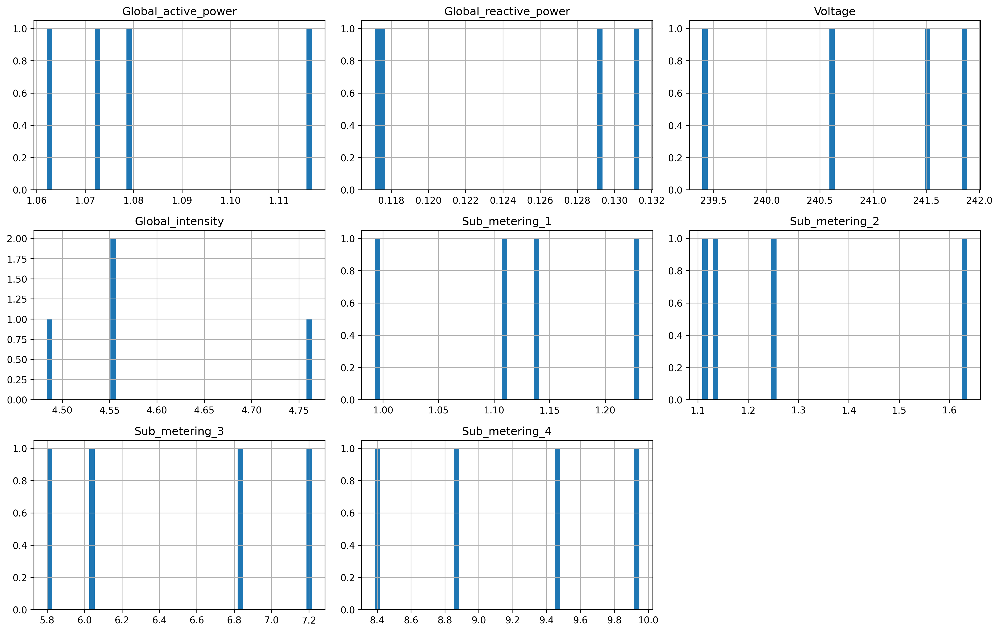

 

************************************************ Correlation Plot for Yearly Resampled Data **************************************************



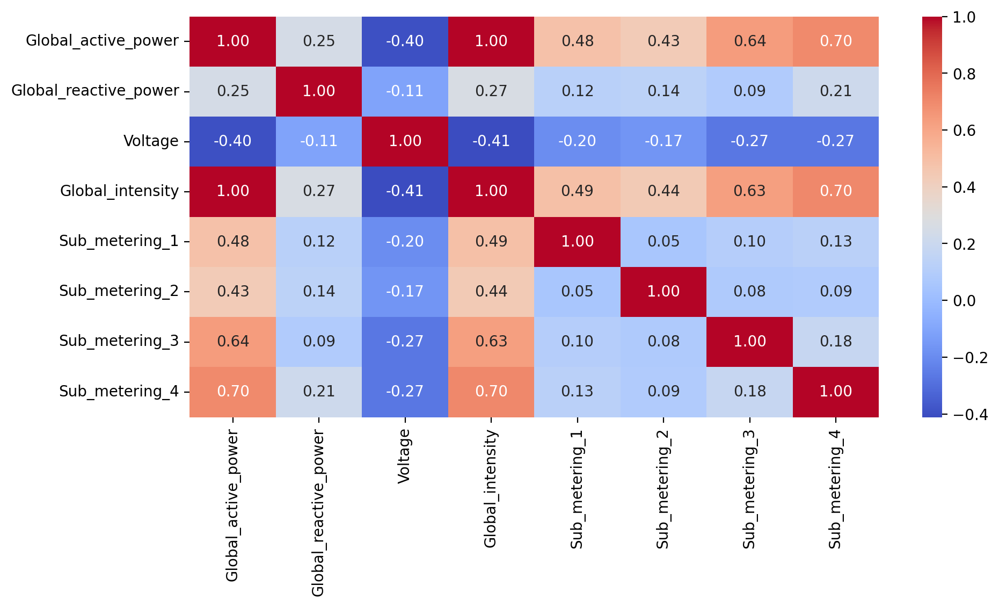

In [ ]:
# Plot the visualization, distribution and correlation of Yearly resampled data
df_visu_dist_corr(df1, "Y", "Yearly")

Observation:-
+ It is observed that as we increase the resampling criteria from hour to month and year,
 + There is a drop in seasonal periodicity pattern.
 + The distribution is becoming close to normal (not exactly normal) for some features.
 + An increase in correlation is observed between features.

## Exploratory Data Analysis(EDA) of Global Active Power Consumption and Sub_meterings

Note:- As the dataset has only 16 records for the 2006 year, this may mislead our analysis. As I will analyse the data monthly, and yearly these 16 records will not help us understand the data flow for the year 2006. We will remove those 16 records from 2006 and move ahead with the analysis of the remaining four-year data.

In [ ]:
# Filter out 2006 data, only keep data post 2006
df1 = df1[df1.index.year>2006]

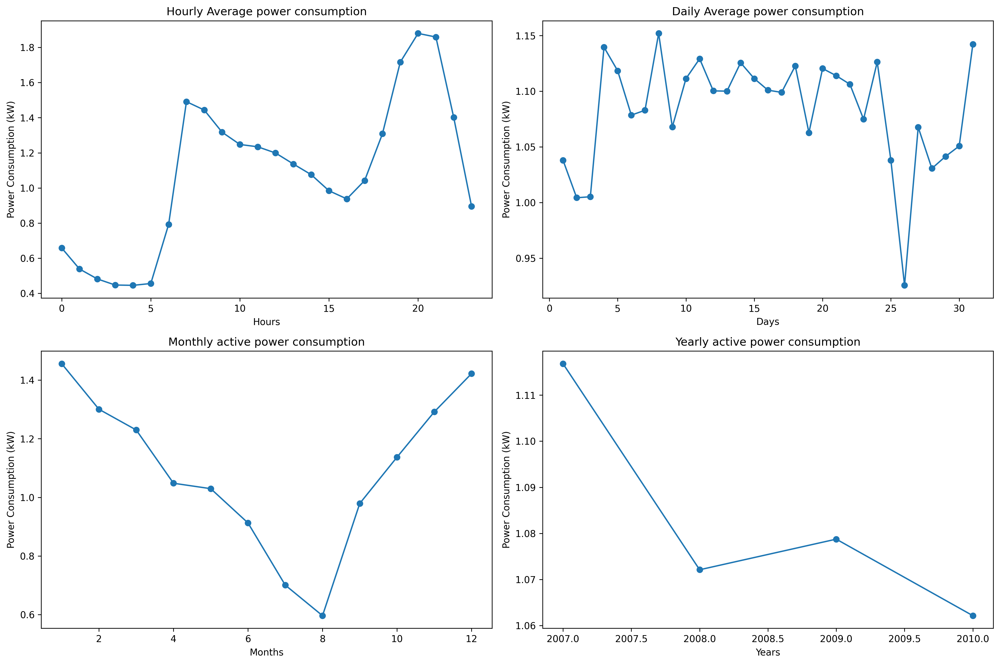

In [ ]:
# Plots for avarage power consumption for horly, daily, monthly, and yearly
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 10), dpi=300)
df1.Global_active_power.groupby(df1.Global_active_power.index.hour).mean().plot(ax=axes[0, 0], kind="line", xlabel="Hours",
                                                                                ylabel="Power Consumption (kW)",
                                                                                title="Hourly Average power consumption",
                                                                                marker='o', linestyle='-')
df1.Global_active_power.groupby(df1.Global_active_power.index.day).mean().plot(ax=axes[0, 1], kind="line", xlabel="Days",
                                                                               ylabel="Power Consumption (kW)",
                                                                               title="Daily Average power consumption",
                                                                               marker='o', linestyle='-')
df1.Global_active_power.groupby(df1.Global_active_power.index.month).mean().plot(ax=axes[1, 0], kind="line", xlabel="Months",
                                                                                 ylabel="Power Consumption (kW)",
                                                                                 title="Monthly active power consumption",
                                                                                 marker='o', linestyle='-')
df1.Global_active_power.groupby(df1.Global_active_power.index.year).mean().plot(ax=axes[1, 1], kind="line",
                                                                                xlabel="Years", ylabel="Power Consumption (kW)",
                                                                                title="Yearly active power consumption",
                                                                                marker='o', linestyle='-')
plt.tight_layout()

## Visualize the usage of global active power by Sub_meterings

In [ ]:
# Creating sub-dataframe of sub-metering 1, sub-metering 2, sub-metering 3 (measured in watt-hour)
df1_sub_meterings = df1[['Sub_metering_1','Sub_metering_2','Sub_metering_3']]

In [ ]:
# Plots for watt-hour of active energy for sub-metering for horly, daily, monthly, and yearly
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(20, 30), dpi=300)
df1_sub_meterings.groupby(df1_sub_meterings.index.hour).mean().plot(ax=axes[0], kind="bar", xlabel="Hours",
                                                                    ylabel="watt-hour of active energy", edgecolor='black',
                                                                    title="Hourly Average watt-hour of active energy for sub-meterings")
df1_sub_meterings.groupby(df1_sub_meterings.index.day).mean().plot(ax=axes[1], kind="bar", xlabel="Days",
                                                                   ylabel="watt-hour of active energy", edgecolor='black',
                                                                   title="Daily Average watt-hour of active energy for sub-meterings")
df1_sub_meterings.groupby(df1_sub_meterings.index.month).mean().plot(ax=axes[2], kind="bar", xlabel="Months",
                                                                     ylabel="watt-hour of active energy", edgecolor='black',
                                                                     title="Monthly Average watt-hour of active energy for sub-meterings")
df1_sub_meterings.groupby(df1_sub_meterings.index.year).mean().plot(ax=axes[3], kind="bar", xlabel="Years",
                                                                    ylabel="watt-hour of active energy", edgecolor='black',
                                                                    title="Yearly Average watt-hour of active energy for sub-meterings")
plt.tight_layout()

# Feature Engineering

In [ ]:
# Create new columns for minute, hour, day, quarter, month, and year
df1['minute'] = df1.index.minute
df1['hour'] = df1.index.hour
df1['month'] = df1.index.month
df1['quarter'] = df1.index.quarter
df1['year'] = df1.index.year
df1['week_of_year'] = df1.index.isocalendar().week
df1['day_of_week'] = df1.index.dayofweek
df1['day_of_month'] = df1.index.day
df1['day_of_year'] = df1.index.dayofyear
df1

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Sub_metering_4,minute,hour,month,quarter,year,week_of_year,day_of_week,day_of_month,day_of_year
date_time,,,,,,,,,,,,,,,,,
2007-01-01 00:00:00,2.58,0.136,241.97,10.6,0.0,0.0,0.0,43.0,0,0,1,1,2007,1,0,1,1
2007-01-01 00:01:00,2.552,0.1,241.75,10.4,0.0,0.0,0.0,42.533333,1,0,1,1,2007,1,0,1,1
2007-01-01 00:02:00,2.55,0.1,241.64,10.4,0.0,0.0,0.0,42.5,2,0,1,1,2007,1,0,1,1
2007-01-01 00:03:00,2.55,0.1,241.71,10.4,0.0,0.0,0.0,42.5,3,0,1,1,2007,1,0,1,1
2007-01-01 00:04:00,2.554,0.1,241.98,10.4,0.0,0.0,0.0,42.566667,4,0,1,1,2007,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-11-26 20:58:00,0.946,0.0,240.43,4.0,0.0,0.0,0.0,15.766667,58,20,11,4,2010,47,4,26,330
2010-11-26 20:59:00,0.944,0.0,240.0,4.0,0.0,0.0,0.0,15.733333,59,20,11,4,2010,47,4,26,330
2010-11-26 21:00:00,0.938,0.0,239.82,3.8,0.0,0.0,0.0,15.633333,0,21,11,4,2010,47,4,26,330


# Data Decomposition

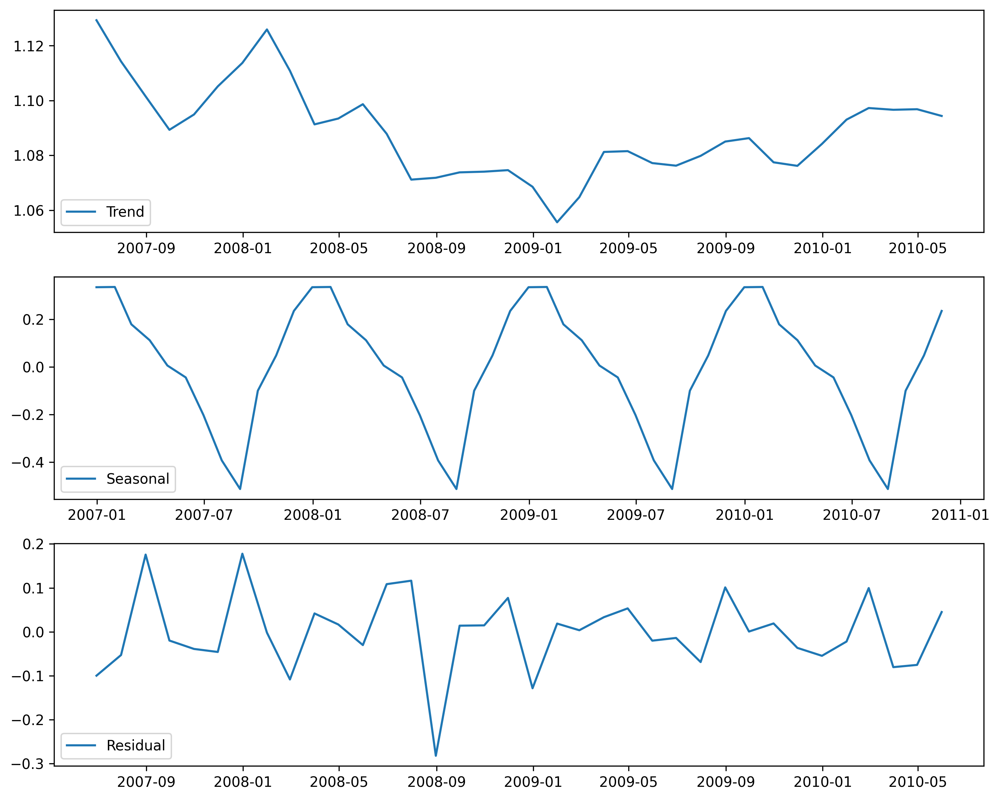

In [ ]:
# Seasonal decomposition of monthly resampled data
decomp = seasonal_decompose(monthly_resampled.Global_active_power, model='Additive')

# Plotting the components
plt.figure(figsize=(10, 8), dpi=300)
plt.subplot(3, 1, 1)
plt.plot(decomp.trend, label='Trend')
plt.legend(loc='lower left')
plt.subplot(3, 1, 2)
plt.plot(decomp.seasonal, label='Seasonal')
plt.legend(loc='lower left')
plt.subplot(3, 1, 3)
plt.plot(decomp.resid, label='Residual')
plt.legend(loc='lower left')
plt.tight_layout()
plt.show()

In [ ]:
# Summary statistics of residual errors
print(pd.Series(decomp.resid).describe())

count             36.0
mean     -0.0018872556
std        0.088000023
min         -0.2823974
25%       -0.047751189
50%     -0.00074353589
75%        0.042540875
max         0.17774503
Name: resid, dtype: float64
